In [1]:
# import
import pandas as pd
import numpy as np
import seaborn as sns

# Personal Bank Loan

**Objetivo**

O intuito do projeto é fazer com que o aluno trabalhe em dados reais e realize análises para identificar problemas e/ou oportunidades relacionadas ao contexto do problema. Para isso, deverá se aprofundar nos dados, no contexto de negócio e, em conjunto com sua equipe, determinar estratégias, encontrar insights e, por fim, documentar e apresentar resultados obtidos.

Fonte: [https://www.kaggle.com/datasets/itsmesunil/bank-loan-modelling](https://www.kaggle.com/datasets/itsmesunil/bank-loan-modelling)

Você deve entender o contexto e o objetivo principal do problema. Além disso, você irá apresentar sua análise, de forma que consiga passar a mensagem/história da solução de forma clara e direcionada para uma gerência não muito técnica e uma outra de marketing. Você terá como suporte o professor, que será considerado como a principal ponte entre a área de negócios e sua área de análise de dados/BI.

**Dataset**:

Essas são as descrições das colunas do dataset:

| Column            | Description                       |
|-------------------|-----------------------------------|
| Customer ID       | ID do cliente                    |
| Age               | Idade em anos completos           |
| Experience        | Número de anos de experiência profissional |
| Income            | Renda anual do cliente ($000)     |
| ZIPCode           | Código ZIP do endereço residencial |
| Family            | Tamanho da família do cliente    |
| CCAvg             | Gasto médio em cartão de crédito por mês ($000) |
| Education         | Nível de educação. 1: Graduação; 2: Pós-Graduação; 3: Avançada/Profissional |
| Mortgage          | Valor da hipoteca da casa, se houver ($000) |
| Personal Loan     | Este cliente aceitou o empréstimo pessoal oferecido na última campanha? |
| Securities Account | O cliente possui uma conta de títulos com o banco? |
| CD Account        | O cliente possui uma conta de depósito a prazo (CDB) com o banco? |
| Online            | O cliente usa as facilidades de banco pela internet? |
| CreditCard        | O cliente usa um cartão de crédito emitido pelo UniversalBank? |

*($000) siginifica que cada unidade representa 1000 USD

**Envio do projeto**

* Equipe: 3 a 4 pessoas
* Data: 8/abr 15h (início da última aula)
* Entregar: 
    * documentação em .ipynb + apresentação da análise do projeto em pdf
        * OU Um .zip 
        * OU Um link do github
* Conteúdo: Fica a critério do aluno, mas deve conter minimamente todas as etapas de EDA da aula 0.

**Critério de avaliação**

* Conteúdo das entregas (2 ponto)
* Apresentação com clareza e objetividade para o público-alvo (2 pontos)
* Apresentação oral (2 pontos)
* Documentação com profundidade técnica (4 pontos)

In [4]:
#load dataset
raw_data = pd.read_csv('./data/Bank_Personal_Loan_Modelling.csv')

In [5]:
if False:
    # inserir valores nulos aleatoriamente em alguns campos
    colunas_com_valores_nulos = ['Education', 'Online']

    # selecionar 200 indices aleatorios
    rows2change = 178
    seed = 11
    np.random.seed(seed)
    idxs = np.random.choice(raw_data.index, rows2change)

    # separar na metade para lista duplicada e valores contendo nulos
    nan_idxs,dup_idxs = idxs.reshape((2,len(idxs)//2))

    # aplicar valores NaN
    nan_rows = raw_data.loc[nan_idxs].copy()
    cols2nan = np.random.choice(colunas_com_valores_nulos,rows2change)
    for idx,col in zip (nan_rows.index,cols2nan):
        nan_rows.loc[idx,col] = np.nan

    # duplicados, alterar o id
    dup_rows = raw_data.loc[dup_idxs].copy()

    # add changes to original data and save it
    changed_data = pd.concat([raw_data, nan_rows, dup_rows])
    changed_data.to_csv('./data/Projectdata_Bank_Personal_Loan_Modelling.csv', index=False, encoding='utf-8-sig', sep=',')

In [6]:
raw_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 14 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   ID                  5000 non-null   int64  
 1   Age                 5000 non-null   int64  
 2   Experience          5000 non-null   int64  
 3   Income              5000 non-null   int64  
 4   ZIP Code            5000 non-null   int64  
 5   Family              5000 non-null   int64  
 6   CCAvg               5000 non-null   float64
 7   Education           5000 non-null   int64  
 8   Mortgage            5000 non-null   int64  
 9   Personal Loan       5000 non-null   int64  
 10  Securities Account  5000 non-null   int64  
 11  CD Account          5000 non-null   int64  
 12  Online              5000 non-null   int64  
 13  CreditCard          5000 non-null   int64  
dtypes: float64(1), int64(13)
memory usage: 547.0 KB


In [7]:
raw_data.describe(include='all')

,ID,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard
count,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.00000,5000.000000,5000.000000
mean,2500.500000,45.338400,20.104600,73.774200,93152.503000,2.396400,1.937938,1.881000,56.498800,0.096000,0.104400,0.06040,0.596800,0.294000
std,1443.520003,11.463166,11.467954,46.033729,2121.852197,1.147663,1.747659,0.839869,101.713802,0.294621,0.305809,0.23825,0.490589,0.455637
min,1.000000,23.000000,-3.000000,8.000000,9307.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
25%,1250.750000,35.000000,10.000000,39.000000,91911.000000,1.000000,0.700000,1.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
50%,2500.500000,45.000000,20.000000,64.000000,93437.000000,2.000000,1.500000,2.000000,0.000000,0.000000,0.000000,0.00000,1.000000,0.000000
75%,3750.250000,55.000000,30.000000,98.000000,94608.000000,3.000000,2.500000,3.000000,101.000000,0.000000,0.000000,0.00000,1.000000,1.000000
max,5000.000000,67.000000,43.000000,224.000000,96651.000000,4.000000,10.000000,3.000000,635.000000,1.000000,1.000000,1.00000,1.000000,1.000000


<Axes: >

Error in callback <function _draw_all_if_interactive at 0x000001FB1F82B240> (for post_execute):


KeyboardInterrupt: 

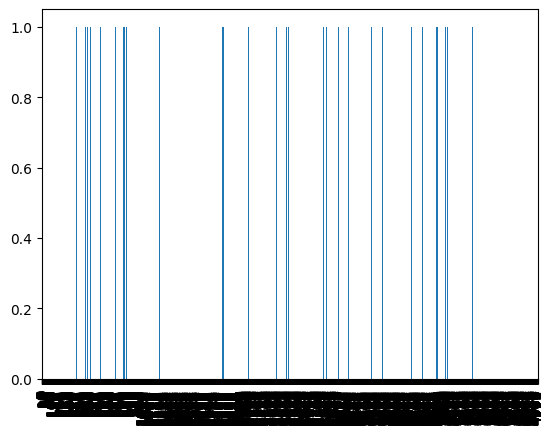

In [21]:
raw_data['Securities Account'].count().plot(kind='bar')

In [50]:
from pandas_profiling import ProfileReport

C:\Users\AllanSuzuki\AppData\Local\Temp\ipykernel_9152\2274191625.py:1: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  from pandas_profiling import ProfileReport


In [51]:
clean_df = raw_data.drop_duplicates()

In [52]:
profile = ProfileReport(clean_df)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [53]:
import pygwalker as pyg

In [54]:
walker = pyg.walk(raw_data)

Box(children=(HTML(value='<div id="ifr-pyg-000613dd66c593314i7N8Xeatu9xrBEL" style="height: auto">\n    <head>…